# Generating prediction models for bicycle accidents 2005-2020

### Introduction

The goal of this notebook is to find models that are suited for our use case, and try to improve their performance by testing different sets of parameters, reducing & resampling data, and finding a suited metric for the evaluation scorer.

### Import Libraries & packages

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from statsmodels.formula.api import ols

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.metrics import classification_report, recall_score, precision_score, make_scorer, roc_auc_score, plot_confusion_matrix

from sklearn.model_selection import GridSearchCV, StratifiedShuffleSplit, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LassoCV, LogisticRegression
import xgboost as xgb
import lightgbm as lgb

import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from timeit import default_timer as timer
from datetime import timedelta
from joblib import dump, load

import warnings
warnings.filterwarnings('ignore')
#warnings.filterwarnings(action='once')

### Import filtered dataset for bicycle accidents 2005-2020

In [2]:
df= pd.read_csv('data/bicycle_accidents_05_20_filtered.csv',sep=';', squeeze=True, parse_dates={'date':['an','mois','jour','hrmn']})
df

,date,grav,sexe,lum,agg,int,atm,catr,circ,nbv,vosp,plan,surf,infra,situ,age
0,2005-01-13 19:45:00,4,1,5,2,1,1,3,2,2,0,1,1,0,1,59
1,2005-01-19 10:45:00,3,1,1,1,1,7,3,2,2,0,3,1,0,1,21
2,2005-01-26 13:15:00,4,1,1,1,9,1,3,2,2,0,1,1,0,1,72
3,2005-01-03 13:30:00,3,2,1,2,1,1,3,2,2,0,2,1,0,1,52
4,2005-01-29 18:30:00,4,1,3,1,1,1,3,2,2,0,1,1,0,1,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74922,2020-11-30 14:25:00,3,2,1,2,1,1,7,2,4,1,1,1,0,5,61
74923,2020-11-30 17:38:00,4,2,1,2,1,1,4,2,2,0,1,1,0,1,67
74924,2020-12-01 11:11:00,4,1,1,2,3,1,4,2,2,0,1,1,0,1,67
74925,2020-12-01 13:30:00,4,2,1,2,4,2,4,2,2,0,3,2,0,8,61


### Define the target variable and the features

In [3]:
#selecting explanatory features
data= df.drop(['grav', 'date'],1).copy()

#selecting target variable
target= df['grav']

### Adjusting *data* & *target*

In [4]:
#We cut the 'age' features into the 5 categories above:
data['age']= pd.cut(data.age, bins=[0,12,20,40,60,99], labels=[1,2,3,4,5] )

#save a copy of the original data
data_original= data.copy()

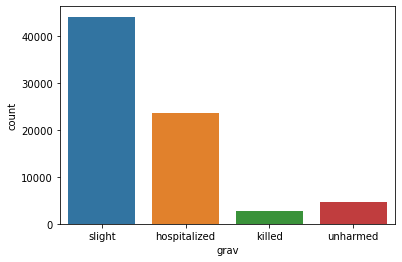

In [179]:
#counting 'grav' values:
# killed=2, hospitalized=3, slightly injured=4, unharmed=1
sns.countplot(df.grav.replace([1,2,3,4], ['unharmed','killed','hospitalized','slight']))
plt.show();

In order to simplify our model, and also to better balance our dataset, we will limit our categories to two: 
1. The first between 'killed'(2) & 'hospitalized'(3), we will call it **'killed/hospitalized'** category or **category 1**. 
2. The second category between 'unharmed'(1) & 'Slightly injured'(4), we will call it **'unharmed/slightly injured'** category or **category 0**
Limiting labels of the target to two has given us better results, qwhen experiencing on DecisionTree and LogisticRegression models.

In [5]:
#Limiting target's labels to 2:
target= target.replace([[1,4],[2,3]], [0,1])

target.value_counts()

0    48725
1    26202
Name: grav, dtype: int64

### Preprocessing : Encoding and splitting data

Now that the values of our features and their type is defined (all features are categorical), we need to encode our data before doing any modeling. We will use One-Hot encoding. Then we will split our data to trainset and testset.

In [6]:
#keeping a copy of the original dataset:
data_original= data.copy()
data= data.astype('category')

# Dummy encoding:
data= pd.get_dummies(data)
X_train, X_test, y_train, y_test = train_test_split(data, target, test_size= .2, random_state= 42, shuffle=True, stratify=target )

### Dimensions Reduction
#### Features selection

In this part we will try to sort out features with higher importance. In order to validate our choice it has been tested and compared with original data using different values.
Note that we have tested SelectKBest & VarianceThreshold from scikit-learn, they gave us same results. We kept the first selector.

In [7]:
#This value is chosen after testing diffrent k values on DecisionTreeClassifier
# chi2 score is suited for testing score for categorial variables:
select= SelectKBest(score_func=chi2, k=60 )

X_train = select.fit_transform(X_train,y_train)
X_test = select.transform(X_test)

#print(data.columns[select.get_support().tolist()])

#### Features sampling

The goal of samling is to bring the labels of our data to balance since there's a gap between the two categories (as shown in the values count). Sampling has given us better recall scores, wich is the most the most important testing scorer in our cas since it reflects the percentage of true positive and the false negative. Note that the positive category is the killed/hospitalized* caterogy (cat.1), wich is the most critical category and we don't want the mis-predict it.

In [8]:
target.value_counts(normalize=True)

0    0.6503
1    0.3497
Name: grav, dtype: float64

Under-sampling has showed a slightly better scores (recall) than Over-sampling when tested on DecisionTree and LogisticRegression.

In [9]:
#Applying under_sampling
sampler= RandomUnderSampler()
X_train, y_train= sampler.fit_resample(X_train, y_train)

### Finding a suited Evaluation Metric

In order to compare between the performance of diffrent predictions models, we need to find an evaluation scorer that is suited with our usage case. Knowing the criticity of the positive category, wich is the killed/hospitalized category, we need a scorer that evaluate the number of true positives in compare to false negatives. 

The goal is to build a model that avoids as maximum possible the case of false negatives, thats means avoiding the case where there's a severe bicycle accident but was falsely  predicted. This also means predicting bicycle accidents correctly. The metric that reflects this directly is the **recall**: number of true positives in compare to false negatives.


If we choose to rely only on the recall, it means to negligate the evaluation for the true negative. Therefore, we need a scorer that can take all the outcome result into consideration, but gives a higher importance to the recall because it represents the critical part.

The type of scorers that responds to our need are the **Weighted Pythagorean Means of Precision and Recall**: 
 * The Weighted Geometric Mean
 * The Weighted Arithmetic Mean
*R: Recall, P: Precision, $\beta$ : Weight of recall*
<img src="images/wam.png">

For more details please refer to : [Evaluating Classification Models, Part 1: Weighing False Positives Against False Negatives](https://medium.com/shoprunner/evaluating-classification-models-1-ff0730801f17)

Let's compare between the weighted arithmetic and geometric means

In [26]:
#This is a graphical representation of the Weighted Arithmetic Mean (change the slider to adjust Beta):

Precision= np.arange(0,1.01, 0.01)
Recall= np.arange(0, 1.01, 0.01)

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for Beta in np.arange(1, 10.5, .5):

    Arithmetic_mean=np.zeros((len(Precision), len(Recall)))

    for i, precision in enumerate(Precision):
        for j, recall in enumerate(Recall):
            Arithmetic_mean[i,j]= (precision+(recall*Beta))/(1+Beta)

    fig.add_trace( 
        go.Contour(
            visible=False,
            line=dict(color="black", width=1),
            name="Beta = " + str(Beta),
            z=Arithmetic_mean,
            x=Precision,
            y=Recall))

# Make 0th trace visible
fig.data[0].visible = True

# Create slider
betas = []
for i in range(len(fig.data)):
    beta = dict(
        method="restyle",
        args=["visible", [False] * len(fig.data)],
        label= i/2+1
    )
    beta["args"][1][i] = True  # Toggle i'th trace to "visible"
    betas.append(beta)

sliders = [dict(
    active=20,
    currentvalue={"prefix": "Beta: "},
    pad={"t": 20},
    steps=betas
)]
#Add slider and other params for figure
fig.update_layout(
    sliders=sliders,
    autosize=False,
    width=1000,
    height=700,
    xaxis_title="Recall",
    yaxis_title="Precision",
    title={
        'text': "Weighted Arithmetic Mean",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}
)

fig.update_traces(
hovertemplate="<br>".join([
        "Recall: %{x}",
        "Precision: %{y}",
        "Arithmetic Mean: %{z}"
    ])
)
fig.show()

In [27]:
#This is a graphical representation of the Weighted Geometric Mean (change the slider to adjust Beta):

Precision= np.arange(0,1.01, 0.01)
Recall= np.arange(0, 1.01, 0.01)

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for Beta in np.arange(1, 10.5, .5):

    Geometric_mean=np.zeros((len(Precision), len(Recall)))

    for i, precision in enumerate(Precision):
        for j, recall in enumerate(Recall):
            Geometric_mean[i,j]= (precision*(recall**Beta))**(1/(1+Beta))

    fig.add_trace( 
        go.Contour(
            visible=False,
            line=dict(color="black", width=1),
            name="Beta = " + str(Beta),
            z=Geometric_mean,
            x=Precision,
            y=Recall))

# Make 0th trace visible
fig.data[0].visible = True

# Create and add slider
betas = []
for i in range(len(fig.data)):
    beta = dict(
        method="restyle",
        args=["visible", [False] * len(fig.data)],
        label= i/2+1
    )
    beta["args"][1][i] = True  # Toggle i'th trace to "visible"
    betas.append(beta)

sliders = [dict(
    active=20,
    currentvalue={"prefix": "Beta: "},
    pad={"t": 20},
    steps=betas
)]

fig.update_layout(
    sliders=sliders,
    autosize=False,
    width=1000,
    height=700,
    xaxis_title="Recall",
    yaxis_title="Precision",
    title={
        'text': "Weighted Geometric Mean",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}
)
fig.update_traces(
hovertemplate="<br>".join([
        "Recall: %{x}",
        "Precision: %{y}",
        "Geometric Mean: %{z}"
    ])
)
fig.show()

* The arithmetic mean would be enough in case we are sure the precision will be high. One of the down falls of this scorer is that it depends strongly on the recall and doesn't take the precision into much consideration when its value is low (even null), especially with a big recall weight $\beta$.
* However, the weighted geometric mean depends more on the recall, but changes the behaviour when the precision becomes lower. This is exactly what we need in our case: we want to evaluate our model based on the more weighted recall, but we want it also to take into consideration the precision , and consider the model unsuited if the precision is very low even with a good recall.

Next, we will define the evaluation metric scorer, we choose $\beta$=1.1:

In [10]:
#Define function for our new scorer: 

def Weigthed_geometric_mean(y, y_pred, Beta=1.1):
    recall= recall_score(y, y_pred, pos_label=1)
    precision= precision_score(y, y_pred, pos_label=1)
    return (precision * (recall**Beta))**(1/(1+Beta))

#define the scorer:
wgm_score= make_scorer(Weigthed_geometric_mean, Beta=1.1)

### Hyperparameters evaluation

In this part we test some supervised prediction model for classification on our dataset, using cross validation and the Weighted Geometric Mean Scorer WGM. In order to find the best parameters set for each model, we use the GridSearchCV from scikit-learn package.

We have only kept the models that have returned an acceptable score.

In [11]:
#Define the cross-validation splitting method
CV= StratifiedShuffleSplit(n_splits= 10, test_size=.2, random_state= 42 )

In [12]:
#Define a function that makes the GridCV to get the hyperparameters, print main evaluations & save the generated model using joblib:

def grid_best_params(model, param_grid, cv , X_train, y_train, X_test, y_test):
    #launch GridCV    
    start = timer()
    grid = GridSearchCV(estimator= model, param_grid= param_grid, n_jobs=-1, cv=cv, scoring=wgm_score)
    grid.fit(X_train, y_train)
    end = timer()
    #best model
    best_model= grid.best_estimator_
    #predictions
    y_train_pred = best_model.predict(X_train)
    y_test_pred = best_model.predict(X_test)
    #return
    print("Execution time  : ", timedelta(seconds=end-start))
    print("Best parameters : ", grid.best_params_)
    print("\n",classification_report( y_test, y_test_pred), "\n")
    print("WGM score for trainset : ", Weigthed_geometric_mean(y_train, y_train_pred))
    print("WGM score for testset  : ", Weigthed_geometric_mean(y_test,y_test_pred))
    print("AUC score for testset  : ", roc_auc_score(y_test,y_test_pred))
    #save models
    dump(best_model, str(grid.estimator)[:-2])

    plot_confusion_matrix(best_model, X_test, y_test, values_format='d');

* **Decision Tree Classifier**

Execution time  :  0:00:11.758323
Best parameters :  {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 71}

               precision    recall  f1-score   support

           0       0.79      0.74      0.76      9745
           1       0.56      0.63      0.60      5241

    accuracy                           0.70     14986
   macro avg       0.68      0.68      0.68     14986
weighted avg       0.71      0.70      0.70     14986
 

WGM score for trainset :  0.6700272528751966
WGM score for testset  :  0.5989438692735272
AUC score for testset  :  0.6844973655147689


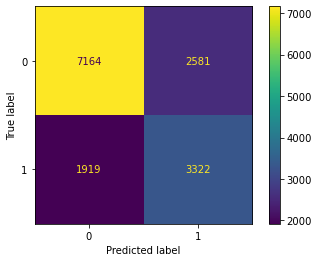

In [184]:
params= { 
    'criterion':['entropy', 'gini'],
    'max_depth':np.arange(3,11,1),
    'min_samples_leaf':np.arange(60,80,1)
}

grid_best_params(DecisionTreeClassifier(), params, CV, X_train, y_train, X_test, y_test)

* **Logistic Regression**

Execution time  :  0:00:03.379248
Best parameters :  {'C': 0.01, 'max_iter': 34}

               precision    recall  f1-score   support

           0       0.79      0.74      0.77      9745
           1       0.57      0.64      0.60      5241

    accuracy                           0.71     14986
   macro avg       0.68      0.69      0.69     14986
weighted avg       0.72      0.71      0.71     14986
 

WGM score for trainset :  0.6696498933647904
WGM score for testset  :  0.6067731816450213
AUC score for testset  :  0.6915955608720717


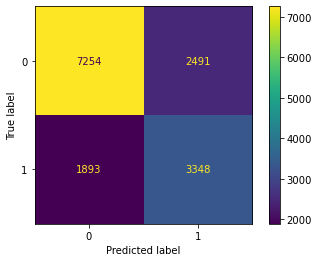

In [188]:
params= {  
    'C':np.linspace(0.001, 0.01, 10), 
    'max_iter':np.arange(30,40,1)
}

grid_best_params(LogisticRegression(), params, CV, X_train, y_train, X_test, y_test)

* **Random Forest**

Execution time  :  0:02:33.457694
Best parameters :  {'max_depth': 15, 'n_estimators': 1500, 'n_jobs': -1}

               precision    recall  f1-score   support

           0       0.79      0.74      0.77      9745
           1       0.57      0.64      0.61      5241

    accuracy                           0.71     14986
   macro avg       0.68      0.69      0.69     14986
weighted avg       0.72      0.71      0.71     14986
 

WGM score for trainset :  0.7406076171307405
WGM score for testset  :  0.6092562491698646
AUC score for testset  :  0.6933496686004467


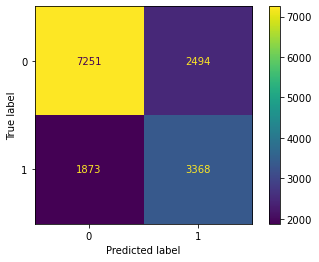

In [197]:
#Tested parameters:
"""params= { 
    'n_estimators':np.arange(800, ,1000, 1200, 1500, 2000),
    'max_depth':np.arange(10,20,1)
}
"""
params= { 
    'n_estimators':[1500],
    'max_depth':[15], 
    'n_jobs':[-1]
}

grid_best_params(RandomForestClassifier(), params, CV, X_train, y_train, X_test, y_test)

* **Radius NeighborsClassifier**

Execution time  :  0:01:24.584552
Best parameters :  {'radius': 3}

               precision    recall  f1-score   support

           0       0.78      0.72      0.75      9745
           1       0.55      0.63      0.59      5241

    accuracy                           0.69     14986
   macro avg       0.67      0.68      0.67     14986
weighted avg       0.70      0.69      0.69     14986
 

WGM score for trainset :  0.6582529966204916
WGM score for testset  :  0.5912644886283038
AUC score for testset  :  0.6764267195472725


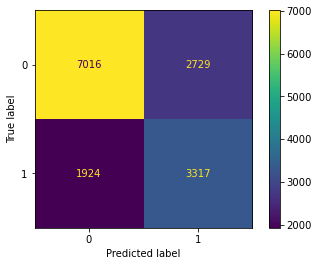

In [202]:
params= { 
    'radius':[3,4,5,6],
    'weights':['uniform', 'distance'],
    'outlier_label':['most_frequent'],
    'leaf_size':np.arange(30,70,10),
    'n_jobs':[-1]
}

grid_best_params(RadiusNeighborsClassifier(), params, CV, X_train, y_train, X_test, y_test)

* **Adaboost Classifier**

Execution time  :  0:00:28.702741
Best parameters :  {'learning_rate': 1.5, 'n_estimators': 100}

               precision    recall  f1-score   support

           0       0.79      0.74      0.77      9745
           1       0.57      0.64      0.60      5241

    accuracy                           0.71     14986
   macro avg       0.68      0.69      0.68     14986
weighted avg       0.71      0.71      0.71     14986
 

WGM score for trainset :  0.6707648706151449
WGM score for testset  :  0.6050101792875598
AUC score for testset  :  0.6901797691936207


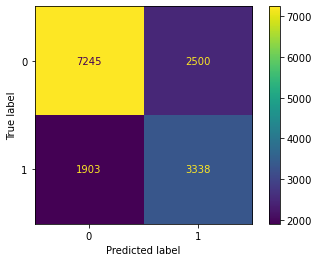

In [228]:
"""params= { 
    'n_estimators':[100,1000, 500],
    'learning_rate':[.1, .5, .9, 1, 1.5]  
}"""
params={
    'n_estimators':[100],
    'learning_rate':[1.5]  
}

grid_best_params(AdaBoostClassifier(), params, CV, X_train, y_train, X_test, y_test)

* **Gradient Boosting Classifier**

Execution time  :  0:08:17.874148
Best parameters :  {'max_depth': 3, 'min_samples_leaf': 25, 'n_estimators': 1000}

               precision    recall  f1-score   support

           0       0.80      0.73      0.77      9745
           1       0.57      0.66      0.61      5241

    accuracy                           0.71     14986
   macro avg       0.69      0.70      0.69     14986
weighted avg       0.72      0.71      0.71     14986
 

WGM score for trainset :  0.6914718621630301
WGM score for testset  :  0.6157008745076024
AUC score for testset  :  0.6965845135676405


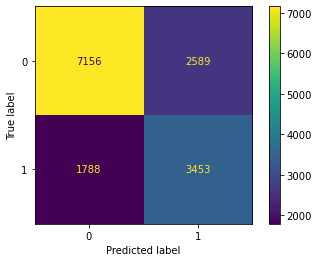

In [215]:
"""params= {
    'n_estimators':[100,1000,1500,200],
    'max_depth': [2,3, 4, 5],
    'min_samples_leaf':[35,30,25, 15,10]
}
"""
params= {
    'n_estimators':[1000],
    'max_depth': [3],
    'min_samples_leaf':[25]
}

grid_best_params(GradientBoostingClassifier(), params, CV, X_train, y_train, X_test, y_test)

* **XGboost**

[15:17:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "colsample" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Execution time  :  0:00:03.859588
Best parameters :  {'gamma': 0, 'learning_rate': 0.25, 'max_depth': 5, 'n_estimators': 1000, 'reg_lambda': 3, 'scale_pos_weight': 5, 'subsample': 0.2}

               precision    recall  f1-score   support

           0       0.96      0.01      0.03      9745
           1       0.35      1.00      0.52      5241

    accuracy                           0.36     14986
   macro avg       0.66      0.51      0.28     14986
weighted avg       0.75      0.36      0.20     14986
 

WGM score for trainset :  0.7205683121477576
WGM score for testset

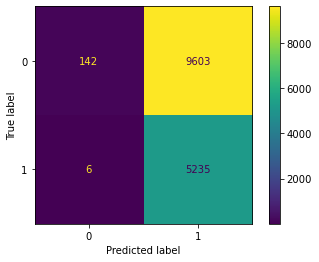

In [16]:
start = timer()
#We tested the commented hyperparameters on many rounds:
"""params= {
    'max_depth':[2,3,4],
    'learning_rate':[0.01, 0.04, 0.05, 0.06, .07, .1, .2, .25],
    'gamma':[0, .01, .25],
    'reg_lambda':[0, 1, 2, 3, 4, 10],
    'scale_pos_weight':[1, 2, 3, 4, 5],
    'subsample':[.2, .3, .1],
    'n_estimators':[100, 1000]
}"""
#The best combination:
params= {
    'max_depth':[3],
    'learning_rate':[ 0.25],
    'gamma':[0],
    'reg_lambda':[3],
    'scale_pos_weight':[5],
    'subsample':[.2],
    'n_estimators':[100]
}
#GridSearch
grid= GridSearchCV(
    estimator= xgb.XGBClassifier(
        objective='binary:logistic',
        seed=42,
        subsample=0.9,
        colsample=0.5),
    param_grid=params,
    scoring=wgm_score,
    verbose=0, 
    n_jobs=-1, 
    cv=CV
)
grid.fit(
    X_train, y_train,
    early_stopping_rounds=3 ,
    eval_set=[(X_test, y_test)],
    eval_metric='aucpr',
    verbose=False
)
end = timer()

#predictions
best_model= grid.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

#Evaluation
print("Execution time  : ", timedelta(seconds=end-start))
print("Best parameters : ", grid.best_params_)
print("\n",classification_report( y_test, y_test_pred), "\n")
print("WGM score for trainset : ", Weigthed_geometric_mean(y_train, y_train_pred))
print("WGM score for testset  : ", Weigthed_geometric_mean(y_test,y_test_pred))
print("AUC score for testset  : ", roc_auc_score(y_test,y_test_pred))
plot_confusion_matrix(best_model, X_test, y_test, values_format='d');

#save models
best_model.save_model('XGBoost.bst')
#dump(best_model, str(grid.estimator)[:-2])

* **LightGBM**

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGB

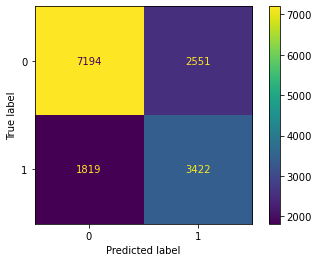

In [261]:
"""params = {
    'num_leaves': [31],
    'learning_rate': [0.05],
    'feature_fraction': [0.9],
    'bagging_fraction': [0.8],
    'bagging_freq': [5],
    'max_depth':[0.5]
}"""
start = timer()

params = {
    'num_leaves': [17],
    'learning_rate': [.07],
    'max_depth':[-1000],
    'feature_fraction': [.4],
    'verbose':[-1]
}

#GridSearch
grid= GridSearchCV(
    estimator= lgb.LGBMClassifier(
        objective='binary'),
    param_grid= params,
    verbose=-1,
    cv=10
)

grid.fit(
    X_train,y_train,
    eval_set=[(X_test,y_test)],
    verbose=0,
    eval_metric='logloss')
end = timer()
best_model= grid.best_estimator_

#best_model= grid.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

#Evaluation
print("Execution time  : ", timedelta(seconds=end-start))
print("Best parameters : ", grid.best_params_)
print("WGM score for trainset : ", Weigthed_geometric_mean(y_train, y_train_pred))
print("WGM score for testset  : ", Weigthed_geometric_mean(y_test,y_test_pred))
print("AUC score for testset  : ", roc_auc_score(y_test,y_test_pred))
plot_confusion_matrix(best_model, X_test, y_test, values_format='d');

print(classification_report(y_test, best_model.predict(X_test)))
